In [1]:
%load_ext autoreload
%autoreload 2

from exp.janus_rl import *

features shape: (782, 228), 
targets shape: (782, 2)

Length of train is 703, test is 79
R squared: 0.6441
Output steps:  [0.064, 0.057]
Active reward function clown_hat
features shape: (782, 228), 
targets shape: (782, 2)

Length of train is 703, test is 79
R squared: 0.6441
Output steps:  [0.064, 0.057]
Active reward function clown_hat


In [2]:
import shap
print('shap version: ',shap.__version__)

shap version:  0.39.0


# calculate shap values

In [4]:
import shap
explainer = shap.TreeExplainer(janus_env.ml_model)

In [5]:
shap_values = explainer.shap_values(janus_env.full_x)

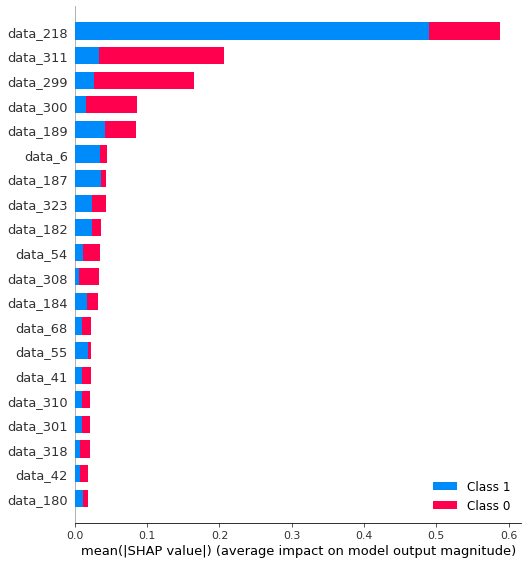

In [6]:
shap.summary_plot(shap_values, janus_env.full_x)

# multi regression case

In [8]:
idx = 100
shap_value_single = explainer.shap_values(X = janus_env.full_x.iloc[idx:idx+1,:])

In [9]:
list_of_labels = janus_env.y_df.columns.to_list()

In [12]:
# Create a list of tuples so that the index of the label is what is returned
tuple_of_labels = list(zip(list_of_labels, range(len(list_of_labels))))

current_label = 'target_0'

In [13]:
# print the JS visualization code to the notebook
shap.initjs()

print(f'Current label Shown: {list_of_labels[0]}')

shap.force_plot(base_value = explainer.expected_value[0],
                shap_values = shap_value_single[0],
                features = janus_env.full_x.iloc[idx:idx+1,:]
                )

Current label Shown: target_0


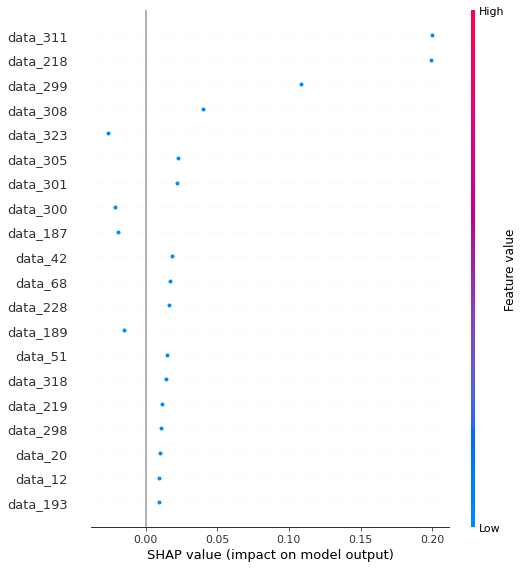

In [14]:
shap.summary_plot(shap_values = shap_value_single[0],
                  features = janus_env.full_x.iloc[idx:idx+1,:]
                  )

## get worst observations

In [3]:
reward_name='clown_hat'
reward_df=pd.read_csv('./data/full_x_'+reward_name+'.csv', index_col=0)

reward_df.sort_values(by='reward_clown_hat')
worst_dropouts = reward_df[reward_df.reward_clown_hat<=-10]

worst_dropouts

,target_0,target_5,reward_clown_hat
2209,-1.143737,0.321727,-10.136722
2210,-1.577403,0.334795,-10.140354
2214,-1.248444,0.474332,-10.179139
2215,-1.310829,0.412264,-10.161887
2216,-1.157145,0.325805,-10.137855
...,...,...,...
11925,-1.355724,-1.826766,-10.460466
11926,-2.283322,-2.363093,-10.609542
11927,-2.192545,-2.075309,-10.529550
11928,-1.566501,-1.742077,-10.436926


## apply shap

In [22]:
shap_values_worst = explainer.shap_values(X = janus_env.full_x.iloc[worst_dropouts.index,:])

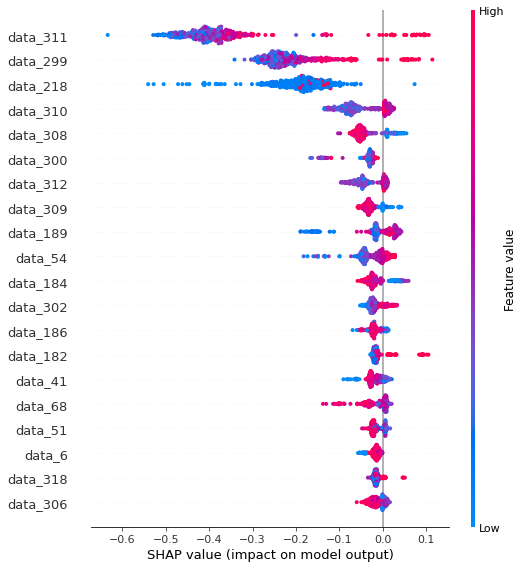

In [23]:
shap.summary_plot(shap_values = shap_values_worst[0],
                  features = janus_env.full_x.iloc[worst_dropouts.index,:]
                  )

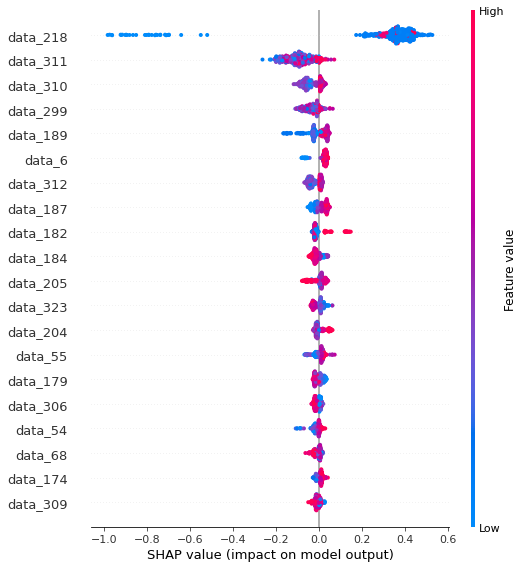

In [24]:
shap.summary_plot(shap_values = shap_values_worst[1],
                  features = janus_env.full_x.iloc[worst_dropouts.index,:]
                  )

In [25]:
shap.initjs()

shap.force_plot(base_value = explainer.expected_value[0],
                shap_values = shap_values_worst[0],
                features = janus_env.full_x.iloc[worst_dropouts.index,:]
                )

## get highest effects from controllable parameters

From target_0:
* data_54
* data_41
* data_68
* data_51
* data_6

From target_5:
* data_6
* data_55
* data_54
* data_68

Let's keep these 6 features in gym

* data_6
* data_41
* data_51
* data_54
* data_55
* data_68

it matches with `new_list = np.argsort(janus_env.ml_model.feature_importances_[:94])[::-1][:6]`

# Train a model with 6 controlable parameters

In [5]:
worst_dropouts.sample()

,target_0,target_5,reward_clown_hat
2485,-1.288729,0.250655,-10.116967


In [9]:
worst_dropouts.sample().index.values[0]

3157

In [10]:
train_RL_model(13, worst_dropouts.sample().index.values[0], 'clown_hat', nb_actions=6)

features shape: (782, 228), 
targets shape: (782, 2)

Length of train is 703, test is 79
R squared: 0.6441
Output steps:  [0.064, 0.057]
Active reward function clown_hat
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Logging to ./tensorboard/EXP 13 - IDX 2506 - clown_hat - 6 actions_1
episode too long -> reset
episode too long -> reset
episode too long -> reset
episode too long -> reset
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 101      |
|    ep_rew_mean     | -594     |
| time/              |          |
|    episodes        | 4        |
|    fps             | 8        |
|    time_elapsed    | 47       |
|    total timesteps | 404      |
| train/             |          |
|    actor_loss      | 8.29     |
|    critic_loss     | 25.3     |
|    learning_rate   | 0.001    |
|    n_updates       | 303      |
---------------------------------
episode too long -> reset
episode too long -> reset
e

episode too long -> reset
episode too long -> reset
episode too long -> reset
episode too long -> reset
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 101      |
|    ep_rew_mean     | -517     |
| time/              |          |
|    episodes        | 56       |
|    fps             | 7        |
|    time_elapsed    | 770      |
|    total timesteps | 5656     |
| train/             |          |
|    actor_loss      | 63.5     |
|    critic_loss     | 142      |
|    learning_rate   | 0.001    |
|    n_updates       | 5555     |
---------------------------------
episode too long -> reset
episode too long -> reset
episode too long -> reset
episode too long -> reset
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 101      |
|    ep_rew_mean     | -511     |
| time/              |          |
|    episodes        | 60       |
|    fps             | 7        |
|    time_elapsed    | 827      |
|    total

In [3]:
visualise_avant_apres(13, 2506, 'clown_hat', 6)

features shape: (782, 228), 
targets shape: (782, 2)

Length of train is 703, test is 79
R squared: 0.6441
Output steps:  [0.064, 0.057]
Active reward function clown_hat
features shape: (782, 228), 
targets shape: (782, 2)

Length of train is 703, test is 79
R squared: 0.6441
Output steps:  [0.064, 0.057]
Active reward function clown_hat
features shape: (782, 228), 
targets shape: (782, 2)

Length of train is 703, test is 79
R squared: 0.6441
Output steps:  [0.064, 0.057]
Active reward function clown_hat
features shape: (782, 228), 
targets shape: (782, 2)

Length of train is 703, test is 79
R squared: 0.6441
Output steps:  [0.064, 0.057]
Active reward function clown_hat
model used: EXP 13 - IDX 2506 - clown_hat - 6 actions
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Index de l observation 2506
init results:  [-1.12808801  0.08801732] reward -1.069 action [ 0.27396002  0.93877554  0.18297872 -0.9472914   0.59178746  0.38812786]
final re